## ⚙️ Configuración inicial

### Librerias

In [75]:

# Instalación de dependencias necesarias
%pip install -q kagglehub

# Importación de librerías
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

print("Entorno configurado correctamente.")


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 90, Finished, Available, Finished)


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Entorno configurado correctamente.



### Funciones

In [76]:
def standarizar_col(col):
    """
    Estandariza el nombre de una columna para que sea seguro al guardar en bases de datos o sistemas tipo Lakehouse/Delta.

    Convierte la cadena a minúsculas, elimina paréntesis, reemplaza espacios y símbolos comunes por guion bajo,
    y elimina guiones bajos repetidos o al final.

    Args:
        col (str): Nombre original de la columna.

    Returns:
        str: Nombre estandarizado de la columna.
    """
    # Elimina espacios iniciales y finales y convierte a minúscula
    col = col.strip().lower()
    # Elimina paréntesis
    col = col.replace('(', '')
    col = col.replace(')', '')
    # Reemplaza espacios, guiones, barras y puntos por guion bajo
    col = col.replace(' ', '_')
    col = col.replace('-', '_')
    col = col.replace('/', '_')
    col = col.replace('.', '_')
    # Elimina guiones bajos dobles por guion bajo simple (si los hubiera)
    col = col.replace('__', '_')
    # Elimina cualquier guion bajo al final del nombre
    col = col.rstrip('_')
    return col


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 92, Finished, Available, Finished)

## 📥 Carga de datos desde Kaggle

In [77]:
# Descargar dataset desde Kaggle usando kagglehub
import kagglehub

# Definir dataset y descargar
path = kagglehub.dataset_download("karnikakapoor/wonders-of-world")

# Verificar archivos descargados
os.listdir(path)

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 93, Finished, Available, Finished)

['wonders_of_world rev3.csv',
 'wonders_of_world_enhanced_25.csv',
 'WondersOfWorld_24.csv',
 'wonders_of_world.csv',
 'WondersOfWorld_July24.csv']

## 💾 Exportación inicial como Parquet

In [78]:
# --- CARGA DE DATOS ---

#Descargar archivo CSV local a Dataframe de Pandas
csv_local_path = f"{path}/wonders_of_world_enhanced_25.csv"
df_pd = pd.read_csv(csv_local_path)

#Verificación de Dataframe pandas
display(df_pd.head())
df_pd.shape


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 94, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 14ef4ad2-0fc9-4dcc-8791-ea66ea074bf4)

(51, 33)

In [79]:
#Conversion de DataFramde de Pandas a Dataframe de Spark
df_spark = spark.createDataFrame(df_pd)

#Verificación de Dataframe Spark
print("Primeras filas:")
display(df_spark.head(5))
print("Shape (filas, columnas):")
print((df_spark.count(), len(df_spark.columns)))


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 95, Finished, Available, Finished)

Primeras filas:


SynapseWidget(Synapse.DataFrame, 9c0fadf3-14dc-4096-a5ae-d8eb04a4f205)

Shape (filas, columnas):
(51, 33)


In [80]:
#Guardar Dataframe como Paquet
df_spark.write.mode("overwrite").format("parquet").save("Files/parquet_raw")


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 96, Finished, Available, Finished)

## 🔍 Análisis Exploratorio de Datos (EDA)

### Revisión de Forma

In [119]:
# Revisión inicial de la estructura de datos
print("Shape:", df_pd.shape)

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 135, Finished, Available, Finished)

Shape: (51, 33)


### Revisión de Filas

In [ ]:
# Primeras filas
print("Primeras filas:")
display(df_pd.head())

### Revisión de Columnas

In [ ]:
# Info general y tipos de datos
print("Info general:")
df_pd.info()

### Revisión de Nulos

In [82]:
# Nulos por columna
print("% Nulos por columna:")
print((df_pd.isnull().sum()/len(df_pd)).sort_values(ascending=False))

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 98, Finished, Available, Finished)

% Nulos por columna:
Last Major Restoration                0.784314
Est. Annual Revenue (USD Millions)    0.725490
Cultural Significance (1-5)           0.705882
Entry Fee (USD)                       0.705882
Dimension Type                        0.705882
Height/Dimension (m)                  0.705882
Construction Duration (Years)         0.686275
UNESCO Criteria                       0.666667
UNESCO Year                           0.666667
Annual Visitors (Millions)            0.627451
Continent                             0.274510
Century                               0.215686
Build Year (Numeric)                  0.215686
Build in year                         0.215686
Build Year (Display)                  0.215686
Threat Level                          0.000000
Conservation Status                   0.000000
Best Visiting Season                  0.000000
Wikipedia link                        0.000000
Picture link                          0.000000
Name                                  0

### Revisión estadística

In [83]:
#Resumen estadístico general por tipos de datos

for tipo in df_pd.dtypes.unique():
    print(f"\n\nResumen estadístico para tipo {tipo}:\n")
    cols = df_pd.select_dtypes(include=[tipo]).columns
    if not cols.empty:
        display(df_pd[cols].describe().reset_index()) 

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 99, Finished, Available, Finished)



Resumen estadístico para tipo object:



SynapseWidget(Synapse.DataFrame, 829501be-4fc6-4990-8a41-00f0862b02bc)



Resumen estadístico para tipo float64:



SynapseWidget(Synapse.DataFrame, 07b41d9a-814e-498f-925b-d87b894b9f7a)



Resumen estadístico para tipo bool:



SynapseWidget(Synapse.DataFrame, e9329864-6991-4a38-8b9f-2ed99aad1f82)

## 🧹 Limpieza de datos

### Duplicados

In [84]:
print(f"Filas duplicadas (todas las columnas): {df_pd.duplicated().sum()}")
print("Filas duplicadas:")
print(df_pd[df_pd.duplicated(keep=False)].shape)
df_pd[df_pd.duplicated(keep=False)].sample(10).sort_values(by="Name")

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 100, Finished, Available, Finished)

Filas duplicadas (todas las columnas): 5
Filas duplicadas:
(10, 33)


,Name,Type,Type (Standardized),Status,Build in year,Build Year (Numeric),Century,Construction Duration (Years),Location,Country,...,Est. Annual Revenue (USD Millions),Entry Fee (USD),Best Visiting Season,Conservation Status,Threat Level,Last Major Restoration,Wikipedia link,Picture link,Build Year (Display),Image Base64
20,Colosseum,New7Wonders Foundation,New Seven Wonders,Exists,80 AD,80.0,1 CE,8.0,"Rome, Italy",Italy,...,120.0,18.0,Year-round,Fair - Ongoing restoration,Low,2016.0,http://en.wikipedia.org/wiki/Colosseum,http://upload.wikimedia.org/wikipedia/commons/...,80 AD,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
21,Colosseum,New7Wonders Foundation,New Seven Wonders,Exists,80 AD,80.0,1 CE,8.0,"Rome, Italy",Italy,...,120.0,18.0,Year-round,Fair - Ongoing restoration,Low,2016.0,http://en.wikipedia.org/wiki/Colosseum,http://upload.wikimedia.org/wikipedia/commons/...,80 AD,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
30,Grand Canyon,Seven Natural Wonders of the World,Natural Wonders,Exists,NaN,NaN,NaN,NaN,"Arizona, United States",United States,...,600.0,35.0,"March-May, September-November",Good - Protected national park,Low,NaN,http://en.wikipedia.org/wiki/Grand_Canyon,https://www.google.com/url?sa=i&url=https%3A%2...,NaN,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
29,Grand Canyon,Seven Natural Wonders of the World,Natural Wonders,Exists,NaN,NaN,NaN,NaN,"Arizona, United States",United States,...,600.0,35.0,"March-May, September-November",Good - Protected national park,Low,NaN,http://en.wikipedia.org/wiki/Grand_Canyon,https://www.google.com/url?sa=i&url=https%3A%2...,NaN,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
22,Great Pyramid of Giza,New7Wonders Foundation,New Seven Wonders,Exists,2560 BC,-2560.0,26 BCE,20.0,"Giza Necropolis, Egypt",Egypt,...,1200.0,20.0,October-April,Good - Active preservation,Low,2020.0,http://en.wikipedia.org/wiki/Great_Pyramid_of_...,http://upload.wikimedia.org/wikipedia/commons/...,2560 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
23,Great Pyramid of Giza,New7Wonders Foundation,New Seven Wonders,Exists,2560 BC,-2560.0,26 BCE,20.0,"Giza Necropolis, Egypt",Egypt,...,1200.0,20.0,October-April,Good - Active preservation,Low,2020.0,http://en.wikipedia.org/wiki/Great_Pyramid_of_...,http://upload.wikimedia.org/wikipedia/commons/...,2560 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
27,Great Wall of China,New7Wonders Foundation,New Seven Wonders,Exists,700 BC,-700.0,7 BCE,2000.0,China,China,...,800.0,10.0,"April-May, September-October",At Risk - Erosion and vandalism,Medium - Erosion,2022.0,http://en.wikipedia.org/wiki/Great_Wall_of_China,http://upload.wikimedia.org/wikipedia/commons/...,700 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
26,Great Wall of China,New7Wonders Foundation,New Seven Wonders,Exists,700 BC,-700.0,7 BCE,2000.0,China,China,...,800.0,10.0,"April-May, September-October",At Risk - Erosion and vandalism,Medium - Erosion,2022.0,http://en.wikipedia.org/wiki/Great_Wall_of_China,http://upload.wikimedia.org/wikipedia/commons/...,700 BC,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
38,Panama Canal,Seven Wonders of the Industrial World,Industrial Wonders,Exists,1881,1881.0,19 CE,NaN,Panama,Panama,...,NaN,NaN,Year-round,Not Available,Not Assessed,NaN,http://en.wikipedia.org/wiki/Panama_Canal,http://upload.wikimedia.org/wikipedia/commons/...,1881,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...
37,Panama Canal,Seven Wonders of the Industrial World,Industrial Wonders,Exists,1881,1881.0,19 CE,NaN,Panama,Panama,...,NaN,NaN,Year-round,Not Available,Not Assessed,NaN,http://en.wikipedia.org/wiki/Panama_Canal,http://upload.wikimedia.org/wikipedia/commons/...,1881,iVBORw0KGgoAAAANSUhEUgAAAtAAAALQCAIAAAA2NdDLAA...


In [85]:
df_pd_sin_duplicados = df_pd.drop_duplicates()
df_pd_sin_duplicados.shape

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 101, Finished, Available, Finished)

(46, 33)

### Heurística

In [86]:
#Columnas eliminadas heuristicamente

to_drop_heur =['Image Base64',
          'Last Major Restoration',
          'Est. Annual Revenue (USD Millions)',
          'Cultural Significance (1-5)',
          'Entry Fee (USD)',
          'Dimension Type',
          'Height/Dimension (m)',
          'Coordinates Valid',
          'Image Base64'

          ]
df_pd_v1 = df_pd_sin_duplicados.drop(columns=to_drop_heur)
display(df_pd_v1.shape)
display(df_pd_v1.head())

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 102, Finished, Available, Finished)

(46, 25)

SynapseWidget(Synapse.DataFrame, bda03dd6-2630-4b63-b2d9-968f3c43f360)

### Detección de columnas redundantes por similitud de valores

In [87]:
# Compara todas las columnas del DataFrame para identificar aquellas
# que contienen datos idénticos o con alto porcentaje de coincidencia.
# Esto permite eliminar duplicaciones semánticas en la estructura del dataset.

colnames = df_pd_v1.columns
umbral = 0.6  # 90%

for i, col1 in enumerate(colnames):
    for j, col2 in enumerate(colnames):
        if i < j and df_pd_v1[col1].equals(df_pd_v1[col2]):
            print(f"{col1} y {col2} son idénticas en sus datos.")
        elif i < j:
            iguales = (df_pd_v1[col1] == df_pd_v1[col2])
            porcentaje = iguales.mean()  # promedio de coincidencias
            if porcentaje >= umbral:
                print(f"{col1} y {col2} son {porcentaje:.1%} iguales en sus datos.")


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 103, Finished, Available, Finished)

Build in year y Build Year (Display) son idénticas en sus datos.
Architectural Style y Primary Material son 71.7% iguales en sus datos.


In [88]:
df_pd_v1[['Architectural Style','Primary Material']]

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 104, Finished, Available, Finished)

,Architectural Style,Primary Material
0,Prehistoric megalithic,"Sarsen stone, bluestone"
1,Not Specified,Not Specified
2,Not Specified,Not Specified
3,Byzantine,"Stone, brick"
4,Ancient Greek,Not Specified
5,Not Specified,Not Specified
6,Not Specified,Not Specified
7,Not Specified,Not Specified
8,Art Deco suspension,Steel
9,Not Specified,Not Specified


In [89]:
to_drop = ['Build Year (Display)','Primary Material']

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 105, Finished, Available, Finished)

### 🔠 Fuzzy Matching entre columnas similares

In [90]:
from difflib import SequenceMatcher

colnames = df_pd_v1.columns
similares = []
for i, col1 in enumerate(colnames):
    for j, col2 in enumerate(colnames):
        if i < j:
            ratio = SequenceMatcher(None, col1, col2).ratio()
            if ratio > 0.7 and col1 != col2:
                similares.append((col1, col2, round(ratio, 2)))

print("Columnas con nombres similares (fuzzy matching):")
for par in similares:
    print(f"{par[0]} <-> {par[1]} (similitud={par[2]})")

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 106, Finished, Available, Finished)

Columnas con nombres similares (fuzzy matching):
Century <-> Country (similitud=0.71)
Latitude <-> Longitude (similitud=0.71)


In [91]:
print("Valores únicos en 'Type':", df_pd_v1['Type'].value_counts())
print("Valores únicos en 'Type (Standardized)':", df_pd_v1['Type (Standardized)'].value_counts())


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 107, Finished, Available, Finished)

Valores únicos en 'Type': Type
New7Wonders Foundation                   8
Seven Natural Wonders of the World       7
Seven Wonders of the Industrial World    7
Ancient                                  6
Civil                                    6
USA Today's New Seven Wonders            6
Medieval                                 5
Temple, Ancient                          1
Name: count, dtype: int64
Valores únicos en 'Type (Standardized)': Type (Standardized)
New Seven Wonders             8
Ancient                       7
Natural Wonders               7
Industrial Wonders            7
Civil                         6
Modern Wonders (USA Today)    6
Medieval                      5
Name: count, dtype: int64


In [92]:
diferentes = df_pd_v1[ df_pd_v1['Type'] != df_pd_v1['Type (Standardized)'] ]
print("Filas donde difiere:")
print(diferentes[['Type', 'Type (Standardized)']])


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 108, Finished, Available, Finished)

Filas donde difiere:
                                     Type         Type (Standardized)
15                 New7Wonders Foundation           New Seven Wonders
18                 New7Wonders Foundation           New Seven Wonders
19                 New7Wonders Foundation           New Seven Wonders
20                 New7Wonders Foundation           New Seven Wonders
22                 New7Wonders Foundation           New Seven Wonders
24                 New7Wonders Foundation           New Seven Wonders
25                 New7Wonders Foundation           New Seven Wonders
26                 New7Wonders Foundation           New Seven Wonders
28     Seven Natural Wonders of the World             Natural Wonders
29     Seven Natural Wonders of the World             Natural Wonders
31     Seven Natural Wonders of the World             Natural Wonders
32     Seven Natural Wonders of the World             Natural Wonders
33     Seven Natural Wonders of the World             Natural Wonders

In [93]:
to_drop.append('Type')

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 109, Finished, Available, Finished)

### Eliminación de columnas irrelevantes

In [94]:
to_drop

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 110, Finished, Available, Finished)

['Build Year (Display)', 'Primary Material', 'Type']

In [95]:
df_drop = df_pd_v1.drop(columns=to_drop)
display(df_drop.head())
df_drop.shape

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 111, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, afa8a0ab-ef41-40c6-9741-8056c2398472)

(46, 22)

### 📊 Efecto de la limpieza sobre la correlación de variables

In [96]:
# Calcula la matriz de correlación para numéricas
cor_mat = df_pd.corr(numeric_only=True).abs()

# Aplica gradiente de color de rojo (baja) a verde (alta correlación)
cor_mat_styled = cor_mat.style.background_gradient(
    cmap='RdYlGn_r',          # Rojo → Amarillo → Verde
    vmin=-1, vmax=1         # Escala de correlación completa
)

display(cor_mat_styled)


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 112, Finished, Available, Finished)

,Build Year (Numeric),Construction Duration (Years),Latitude,Longitude,Coordinates Valid,Height/Dimension (m),UNESCO Year,Cultural Significance (1-5),Annual Visitors (Millions),Est. Annual Revenue (USD Millions),Entry Fee (USD),Last Major Restoration
Build Year (Numeric),1.000000,0.413801,0.155480,0.321353,nan,0.185073,0.245363,0.570469,0.473842,0.867743,0.274071,0.186061
Construction Duration (Years),0.413801,1.000000,0.309779,0.572218,nan,0.857064,0.661484,0.279674,0.033810,0.313747,0.299120,0.364483
Latitude,0.155480,0.309779,1.000000,0.042157,nan,0.158090,0.141114,0.051594,0.458003,0.446060,0.282289,0.179975
Longitude,0.321353,0.572218,0.042157,1.000000,nan,0.634089,0.161837,0.623611,0.099424,0.498240,0.466976,0.044102
Coordinates Valid,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Height/Dimension (m),0.185073,0.857064,0.158090,0.634089,nan,1.000000,0.669468,0.263489,0.113504,0.298908,0.498177,0.354017
UNESCO Year,0.245363,0.661484,0.141114,0.161837,nan,0.669468,1.000000,nan,0.320229,0.155307,0.016178,0.620134
Cultural Significance (1-5),0.570469,0.279674,0.051594,0.623611,nan,0.263489,nan,1.000000,0.080794,0.316749,0.122674,0.361372
Annual Visitors (Millions),0.473842,0.033810,0.458003,0.099424,nan,0.113504,0.320229,0.080794,1.000000,0.126944,0.584537,0.005594
Est. Annual Revenue (USD Millions),0.867743,0.313747,0.446060,0.498240,nan,0.298908,0.155307,0.316749,0.126944,1.000000,0.025021,0.319085


In [97]:
# Calcula la matriz de correlación para numéricas
cor_mat = df_pd_sin_duplicados.corr(numeric_only=True).abs()

# Aplica gradiente de color de rojo (baja) a verde (alta correlación)
cor_mat_styled = cor_mat.style.background_gradient(
    cmap='RdYlGn_r',          # Rojo → Amarillo → Verde
    vmin=-1, vmax=1         # Escala de correlación completa
)

display(cor_mat_styled)


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 113, Finished, Available, Finished)

,Build Year (Numeric),Construction Duration (Years),Latitude,Longitude,Coordinates Valid,Height/Dimension (m),UNESCO Year,Cultural Significance (1-5),Annual Visitors (Millions),Est. Annual Revenue (USD Millions),Entry Fee (USD),Last Major Restoration
Build Year (Numeric),1.000000,0.549372,0.130971,0.261058,nan,0.214114,0.139871,0.568857,0.294301,0.848913,0.214289,0.291208
Construction Duration (Years),0.549372,1.000000,0.317082,0.486545,nan,0.768959,0.573404,0.308730,0.009467,0.355982,0.259256,0.227384
Latitude,0.130971,0.317082,1.000000,0.015413,nan,0.125212,0.115764,0.002128,0.444273,0.436914,0.225376,0.147300
Longitude,0.261058,0.486545,0.015413,1.000000,nan,0.607362,0.049033,0.624966,0.014549,0.574259,0.382618,0.063042
Coordinates Valid,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Height/Dimension (m),0.214114,0.768959,0.125212,0.607362,nan,1.000000,0.467082,0.261332,0.083802,0.358021,0.427878,0.220216
UNESCO Year,0.139871,0.573404,0.115764,0.049033,nan,0.467082,1.000000,nan,0.310905,0.243472,0.052976,0.555730
Cultural Significance (1-5),0.568857,0.308730,0.002128,0.624966,nan,0.261332,nan,1.000000,0.047730,0.337837,0.052153,0.403705
Annual Visitors (Millions),0.294301,0.009467,0.444273,0.014549,nan,0.083802,0.310905,0.047730,1.000000,0.155675,0.557412,0.017675
Est. Annual Revenue (USD Millions),0.848913,0.355982,0.436914,0.574259,nan,0.358021,0.243472,0.337837,0.155675,1.000000,0.144878,0.126831


In [98]:
# Calcula la matriz de correlación para numéricas
cor_mat = df_pd_v1.corr(numeric_only=True).abs()

# Aplica gradiente de color de rojo (baja) a verde (alta correlación)
cor_mat_styled = cor_mat.style.background_gradient(
    cmap='RdYlGn_r',          # Rojo → Amarillo → Verde
    vmin=-1, vmax=1         # Escala de correlación completa
)

display(cor_mat_styled)

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 114, Finished, Available, Finished)

,Build Year (Numeric),Construction Duration (Years),Latitude,Longitude,UNESCO Year,Annual Visitors (Millions)
Build Year (Numeric),1.000000,0.549372,0.130971,0.261058,0.139871,0.294301
Construction Duration (Years),0.549372,1.000000,0.317082,0.486545,0.573404,0.009467
Latitude,0.130971,0.317082,1.000000,0.015413,0.115764,0.444273
Longitude,0.261058,0.486545,0.015413,1.000000,0.049033,0.014549
UNESCO Year,0.139871,0.573404,0.115764,0.049033,1.000000,0.310905
Annual Visitors (Millions),0.294301,0.009467,0.444273,0.014549,0.310905,1.000000


### Últimos detalles

In [99]:
#applicacion de la función
df_drop.columns = [standarizar_col(c) for c in df_drop.columns]
print(df_drop.shape)
df_final = df_drop.copy()
display(df_final.head())

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 115, Finished, Available, Finished)

(46, 22)


SynapseWidget(Synapse.DataFrame, cb9fdef5-1b90-4e53-bff2-d21fb8f74c7e)

## 🪣 Exportación de tabla Delta a Lakehouse

In [100]:
#Transformar el DataFrame final de pandas en datafram de spark.
df_final_spark = spark.createDataFrame(df_final)

#Cargarlo como tabla delta a Files
df_final_spark.write.format("delta").mode("overwrite").save("Tables/delta_7ww")

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 116, Finished, Available, Finished)

In [101]:
# Puedes leerla luego así:
tabla_spark = spark.read.format("delta").load("Tables/delta_7ww")
df = df_final_spark.toPandas()
display(df.shape)
display(df.head())


StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 117, Finished, Available, Finished)

(46, 22)

SynapseWidget(Synapse.DataFrame, c39f0ff5-c5c6-4a24-87b3-c3c1d710e34b)

In [102]:
display(df)

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 118, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 0f053b2c-fc0b-42bc-aa4f-da6825344978)

## 🎨 Gráficas finales para la charla

### 🔹 Distribución por Categoría (para EDA básico)

#### Conteo por tipo y estatus

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 119, Finished, Available, Finished)

<Axes: xlabel='count', ylabel='status'>

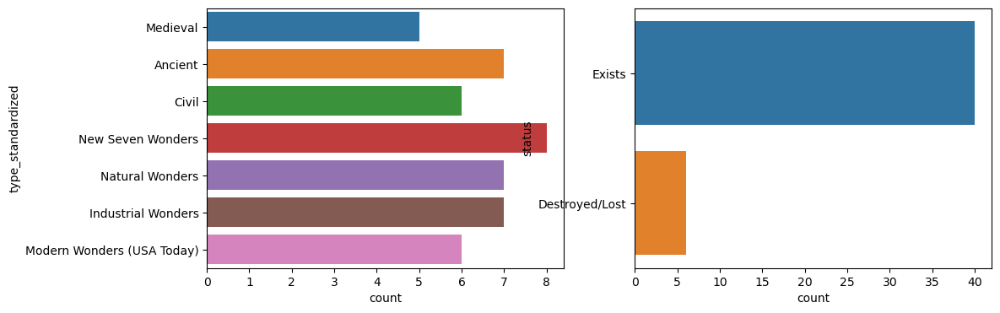

In [103]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
sns.countplot(y='type_standardized', data=df, ax=ax[0])
sns.countplot(y='status', data=df, ax=ax[1])


#💬 Comentario: “Esto nos da una idea inicial del balance de categorías y posibles sesgos.”

#### Distribución de columnas numéricas

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 120, Finished, Available, Finished)

array([[<Axes: title={'center': 'build_year_numeric'}>,
        <Axes: title={'center': 'construction_duration_years'}>]],
      dtype=object)

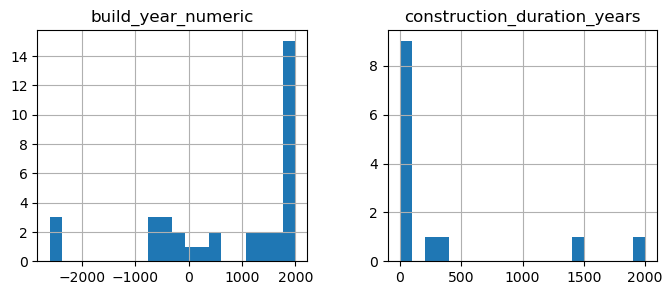

In [104]:
df[['build_year_numeric', 'construction_duration_years']].hist(bins=20, figsize=(8,3))

#💬 Comentario: “Podemos ver anomalías históricas o errores de registro.”

### 🌍 Geografía y contexto histórico

#### Mapa geográfico interactivo
💬 Comentario: “Nos permite confirmar cobertura global y calidad de datos de ubicación.”

In [105]:
fig = px.scatter_geo(df, locations="country", locationmode="country names",
                     hover_name="name", color="type_standardized",
                     title="Distribución geográfica de las maravillas del mundo")
fig.show()

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 121, Finished, Available, Finished)

In [106]:
fig = px.scatter_geo(df,
                     lat='latitude', lon='longitude',
                     hover_name='name',
                     color='type_standardized',
                     title='Distribución geográfica de las maravillas del mundo')
fig.show()

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 122, Finished, Available, Finished)

#### Distribución temporal

**Propósito**: analizar las épocas de construcción.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 123, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='build_year_numeric', ylabel='Count'>

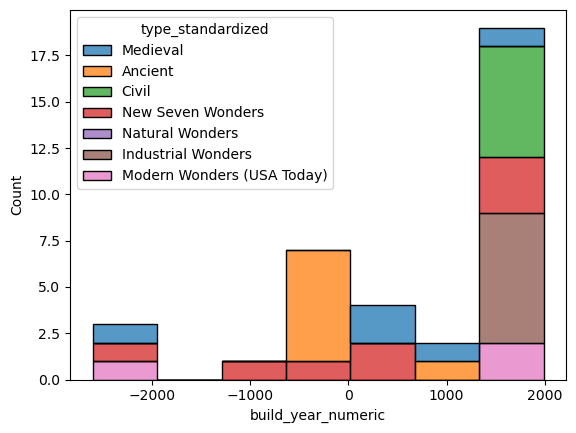

In [107]:
sns.histplot(df, x='build_year_numeric', hue='type_standardized', multiple='stack')

#💬 Comentario: “Podemos ver picos de construcción por siglo o región.”

##### Duración vs siglo

**Propósito**: explorar si las construcciones antiguas tomaban más tiempo.
💬 Comentario: “Visualmente se nota si el esfuerzo constructivo evolucionó con la tecnología.”

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 124, Finished, Available, Finished)

<Axes: xlabel='century', ylabel='construction_duration_years'>

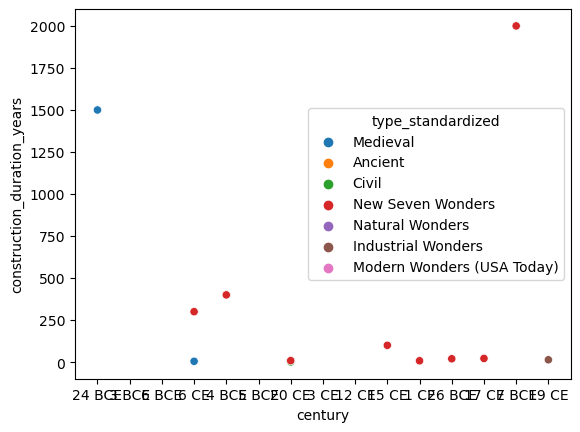

In [108]:
sns.scatterplot(data=df, x='century', y='construction_duration_years', hue='type_standardized')

### 🏛️ Valor cultural y turístico

#### 🔹 Top 10 países con más maravillas

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 125, Finished, Available, Finished)

Text(0.5, 1.0, 'Top 10 países con más maravillas del mundo')

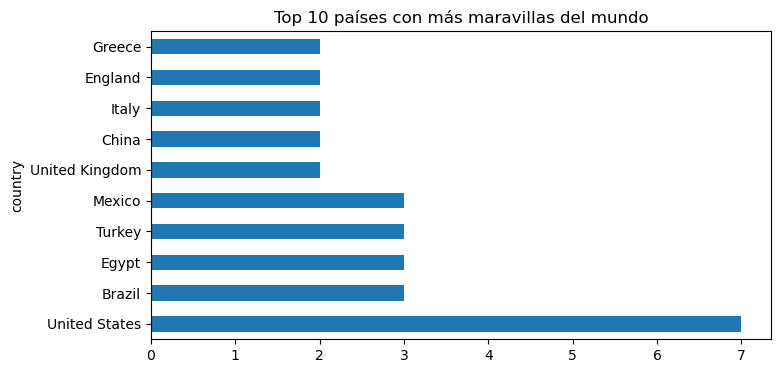

In [109]:
df["country"].value_counts().head(10).plot(kind="barh", figsize=(8,4))
plt.title("Top 10 países con más maravillas del mundo")


#### Maravillas Patrimonio UNESCO

**Propósito**: mostrar la importancia cultural.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 126, Finished, Available, Finished)

<Axes: xlabel='unesco_heritage_site', ylabel='count'>

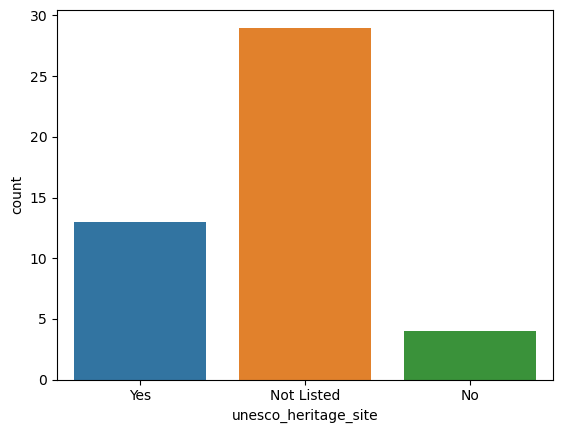

In [110]:
sns.countplot(x='unesco_heritage_site', data=df)

#💬 Comentario: “Podemos calcular el % de maravillas protegidas vs no protegidas.”

#### Visitantes anuales por continente

**Propósito**: conectar con turismo global.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 127, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning:

Mean of empty slice



<Axes: xlabel='continent', ylabel='annual_visitors_millions'>

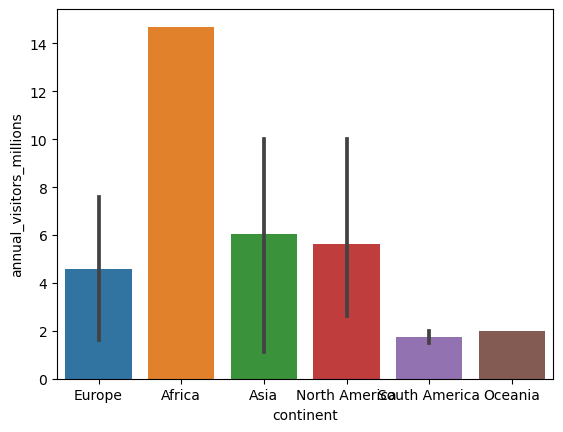

In [111]:
sns.barplot(data=df, x='continent', y='annual_visitors_millions', estimator='mean')

#💬 Comentario: “Permite ver el atractivo turístico medio por región.”

#### Nivel de amenaza vs estado de conservación

**Propósito**: cerrar con una reflexión sobre preservación.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 128, Finished, Available, Finished)

<Axes: xlabel='threat_level', ylabel='annual_visitors_millions'>

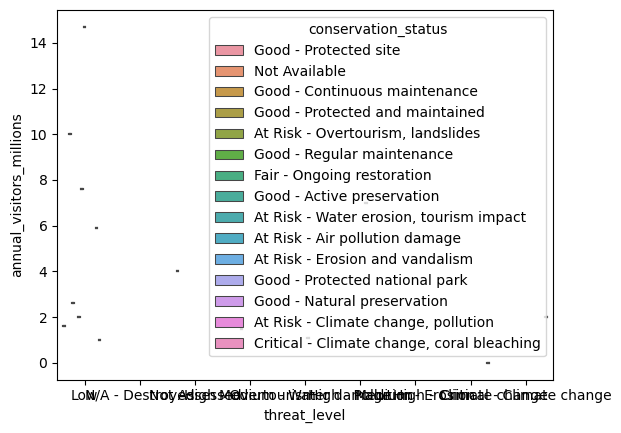

In [112]:
sns.boxplot(data=df, x='threat_level', y='annual_visitors_millions', hue='conservation_status')
#💬 Comentario: “Muestra cómo los lugares más visitados también pueden ser los más amenazados.”

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 129, Finished, Available, Finished)

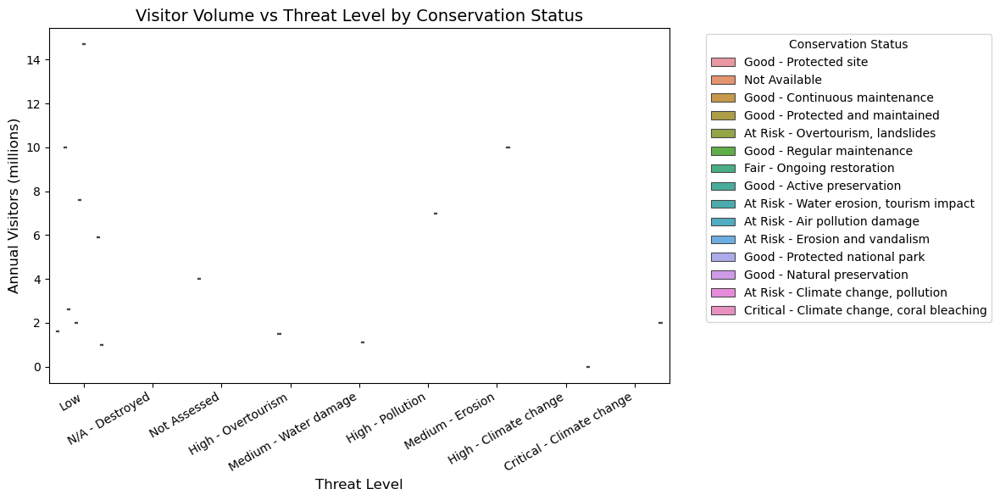

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x='threat_level',
    y='annual_visitors_millions',
    hue='conservation_status'
)

# Rotate x labels for readability
plt.xticks(rotation=30, ha='right')

# Place legend outside to avoid overlap
plt.legend(
    title='Conservation Status',
    bbox_to_anchor=(1.05, 1),
    loc='upper left'
)

# Add clean titles and labels
plt.title("Visitor Volume vs Threat Level by Conservation Status", fontsize=14)
plt.xlabel("Threat Level", fontsize=12)
plt.ylabel("Annual Visitors (millions)", fontsize=12)

plt.tight_layout()
plt.show()


##### 🟢 Opción 1: Scatterplot con tamaño proporcional

- Ideal para ver relación entre amenaza y visitantes, sin el ruido del hue detallado.
- 👉 Claro, simple y resalta patrones sin saturar de colores.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 130, Finished, Available, Finished)

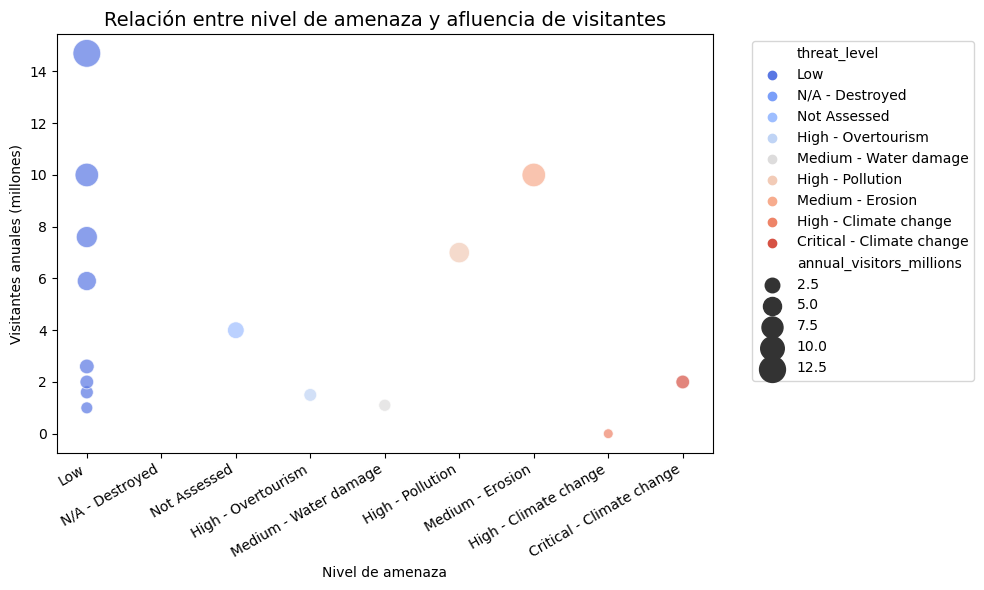

In [114]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    data=df,
    x='threat_level',
    y='annual_visitors_millions',
    size='annual_visitors_millions',
    hue='threat_level',
    sizes=(50, 400),
    alpha=0.7,
    palette='coolwarm'
)

plt.xticks(rotation=30, ha='right')
plt.title("Relación entre nivel de amenaza y afluencia de visitantes", fontsize=14)
plt.xlabel("Nivel de amenaza")
plt.ylabel("Visitantes anuales (millones)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### 🟣 Opción 2: Stripplot + Jitter

- Perfecta si quieres mantener los puntos individuales pero mostrar distribución por categoría.
- 👉 Se ven mejor los solapamientos que con el boxplot.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 131, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



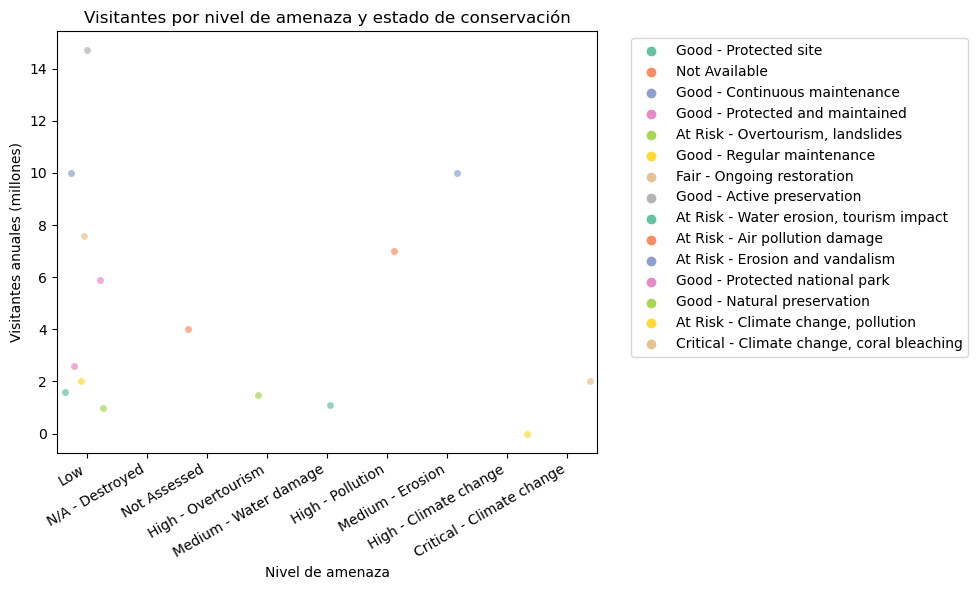

In [115]:
plt.figure(figsize=(10,6))
sns.stripplot(
    data=df,
    x='threat_level',
    y='annual_visitors_millions',
    hue='conservation_status',
    dodge=True,
    jitter=True,
    alpha=0.7,
    palette='Set2'
)

plt.xticks(rotation=30, ha='right')
plt.title("Visitantes por nivel de amenaza y estado de conservación")
plt.xlabel("Nivel de amenaza")
plt.ylabel("Visitantes anuales (millones)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


##### 🔵 Opción 3: Violinplot (más sintético)

- Muestra la distribución y densidad de visitantes por amenaza.
- Funciona si hay más datos por grupo.
- 👉 Muy útil para resúmenes o informes más técnicos.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 132, Finished, Available, Finished)

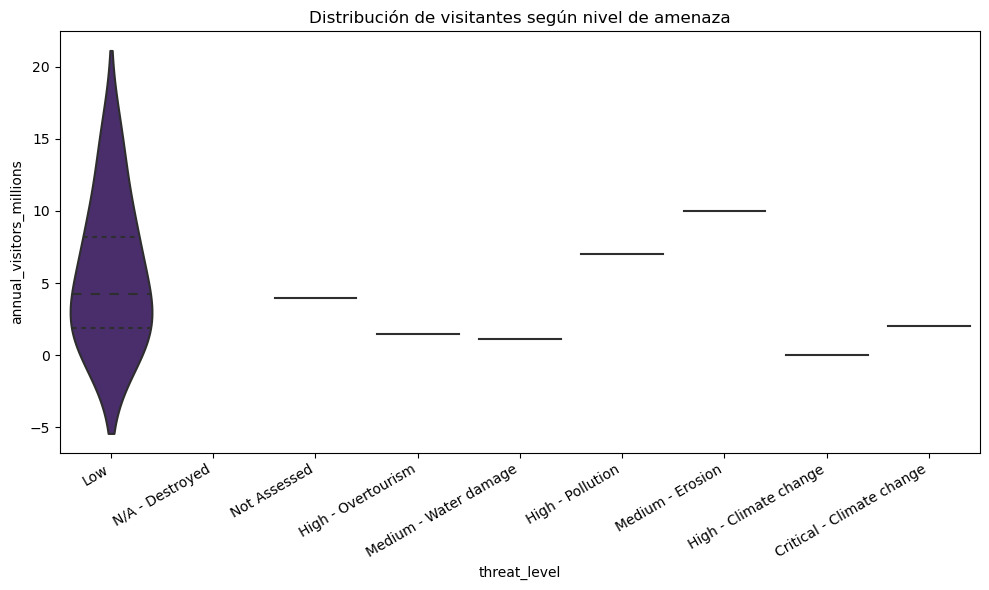

In [116]:
plt.figure(figsize=(10,6))
sns.violinplot(
    data=df,
    x='threat_level',
    y='annual_visitors_millions',
    inner='quartile',
    palette='viridis'
)
plt.xticks(rotation=30, ha='right')
plt.title("Distribución de visitantes según nivel de amenaza")
plt.tight_layout()
plt.show()


##### 🟠 Opción 4: Heatmap resumen

- Si prefieres síntesis por grupo (por ejemplo, promedio de visitantes por nivel de amenaza y estado de conservación):
- 👉 Excelente para mostrar correlaciones o patrones globales.

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 133, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



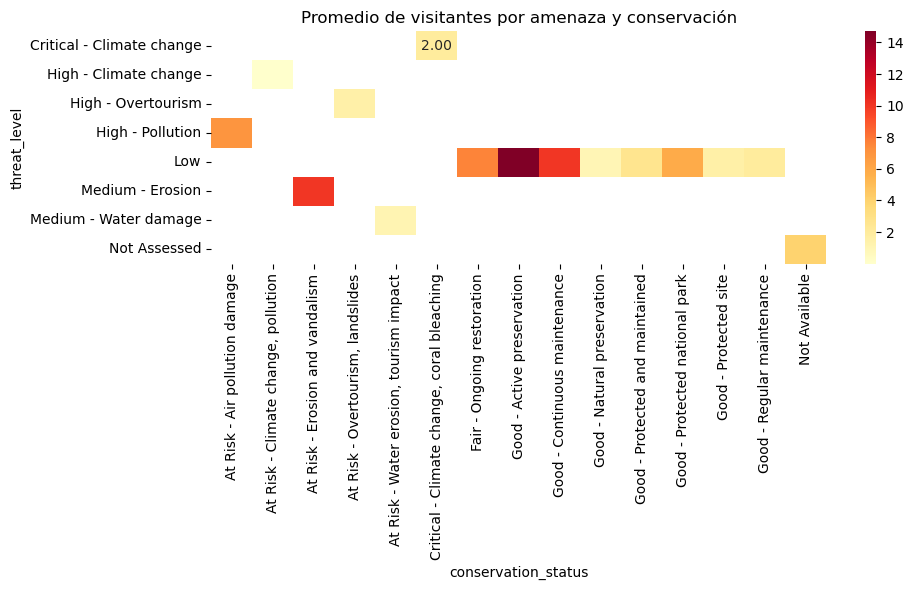

In [117]:
heat = df.pivot_table(
    values='annual_visitors_millions',
    index='threat_level',
    columns='conservation_status',
    aggfunc='mean'
)

plt.figure(figsize=(10,6))
sns.heatmap(heat, cmap='YlOrRd', annot=True, fmt=".2f")
plt.title("Promedio de visitantes por amenaza y conservación")
plt.tight_layout()
plt.show()


### 🧩 BONUS

🎯 Objetivo: elegir el “destino del próximo viaje”

StatementMeta(, 77672bad-3dfe-4feb-b203-ff6cd1430a53, 134, Finished, Available, Finished)

Text(0.5, 1.0, 'Top 10 maravillas más visitadas del mundo')

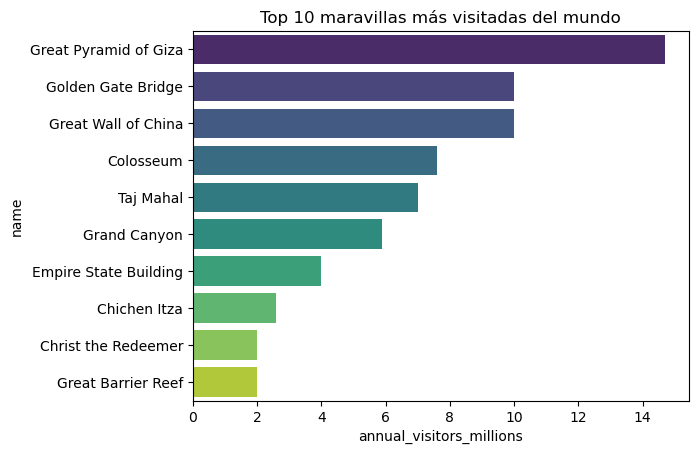

In [118]:
top_visits = df[['name', 'country', 'annual_visitors_millions']].sort_values(by='annual_visitors_millions', ascending=False).head(10)
sns.barplot(data=top_visits, y='name', x='annual_visitors_millions', palette='viridis')
plt.title('Top 10 maravillas más visitadas del mundo')

